# <font color='pink'> Team Friendship <font>

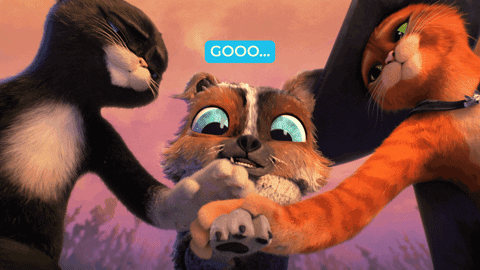

### <font color='pink'> Introduction <font>:
<font color=' dark pink'> As you may already know, for this project we were tasked with finding the "best" out of all 90 Pittsburgh neighborhoods. Now, thats a really broad task, so we did some brainstorming. What makes something the best? How do you measure that? Im sure all of you also had similar thoughts. Well, we decided that the best Pittsburgh neighborhoods would be comfortable, stress free, and most importantly, safe. So, using that knowledge, we picked out our metric. <font>

### <font color='pink'> The Metric(s) <font>:
<font color='dark pink'> Primary - The least stressful/most peaceful<font>

<font color='dark pink'> We chose this as our primary metric because we believe that it is the best umbrella term for the concepts we had already brainstormed. Not only that, but this metric also can be applied to many people (after all, nobody likes stress) and thus more accurately reflects more people's ideas of "best". <font>

* <font color='dark pink'> Secondary 1: Least Crime
* <font color='dark pink'> Secondary 2: Most Greenery (Parks)
* <font color='dark pink'> Secondary 3: Least Fires

<font color='dark pink'> We chose these secondary metrics, or sub-metrcis, for the following reasons: As you are all aware, crime stresses people out, therefore the less crime there is, the less stress there will be. But we didnt just want to include a metric that measures the least of something, we also wanted a metric that measures the most of something, so we went with greenery (measured by the amount of park space in each neighborhood). We see how happy you all are on a bright sunny day walking around Schenley or spending time on the campus greens, so we decided to reflect that in our work! Finally, we chose a sub-metric for the least amount of fires because I think we would all be pretty stressed if our local Starbucks burnt down, unless you prefer a different coffee shop that is. But overall, each of these sub-metrics correlates with human stress levels by either increasing stress or decreasing it and that is why we chose them.

### <font color='pink'> The Code:

#### <font color='dark pink'> The Least Crime - Brandon

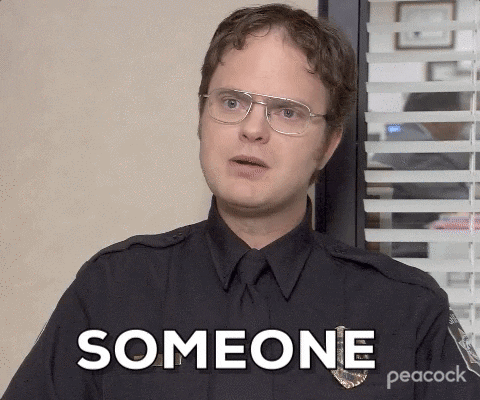

I was working with a 30 Day Crime CSV to get the 30 day crime incidents per neighborhood. I did this in order to see recent crime and not combined crime, as certain areas may have progressing crime since the last total crime report. To start, I read the data from the CSV and imported it into pandas.

In [2]:
import pandas as pd
import geopandas
import matplotlib.pyplot as plt
%matplotlib inline

crime = pd.read_csv("30 Day Crime.csv", sep=",")
crime

,PK,CCR,HIERARCHY,INCIDENTTIME,INCIDENTLOCATION,CLEAREDFLAG,INCIDENTNEIGHBORHOOD,INCIDENTZONE,INCIDENTHIERARCHYDESC,OFFENSES,INCIDENTTRACT,COUNCIL_DISTRICT,PUBLIC_WORKS_DIVISION,X,Y
0,306530435,23035798,6,2023-03-10T11:30:00,"600 Block Penn Ave Pittsburgh, PA 15222",N,Central Business District,2,THEFT,3921 Theft by Unlawful Taking or Disposition.,201.0,6.0,6.0,-80.001793,40.442593
1,307051774,23038735,10,2023-03-16T09:35:00,"800 Block Reunion Pl Pittsburgh, PA 15219",N,Bedford Dwellings,2,TERRORISTIC THREATS,2706 Terroristic Threats. / 2709(a) Harassment.,509.0,NaN,NaN,NaN,NaN
2,307082554,23038816,27,2023-03-16T12:45:00,"N Braddock Ave & Alsace Way Pittsburgh, PA 15208",N,Homewood South,5,HIT AND RUN,3745 Accidents Involving Damage to Unattended ...,1303.0,9.0,2.0,-79.891415,40.452384
3,307106971,23038916,99,2023-03-16T12:00:00,"1400 Block Locust St Pittsburgh, PA 15219",N,Bluff,2,MISSING PERSONS (18+),9490 Missing Persons (18 and Over),103.0,6.0,3.0,-79.985459,40.436044
4,307112015,23038967,6,2023-03-16T17:54:00,"900 Block Liberty Ave Pittsburgh, PA 15222",N,North Oakland,2,RETSIL THEFT (SHOPLIFTING),"3929(a)(1) Retail Theft; takes possession of, ...",403.0,6.0,6.0,-79.997939,40.442945
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2948,307708078,23042905,6,2023-03-23T18:30:00,"300 Block 5th Ave Pittsburgh, PA 15222",N,Central Business District,2,THEFT,3921 Theft by Unlawful Taking or Disposition.,201.0,6.0,6.0,-80.000290,40.440526
2949,307708273,23042913,29,2023-03-23T21:25:00,"1100 Block Crucible St Pittsburgh, PA 15220",N,Crafton Heights,6,RUNAWAYS - JUVENILE,029 Missing Juvenile,2814.0,2.0,5.0,-80.042745,40.444163
2950,307713445,23042978,13,2023-03-24T02:29:00,"600 Block Liberty Ave Pittsburgh, PA 15222",Y,Crawford-Roberts,2,RECEIVING STOLEN PROPERTY,3925 Receiving Stolen Property. / 6106 Firearm...,305.0,6.0,6.0,-80.001624,40.441781
2951,307751502,23043076,6,2023-03-08T11:00:00,"700 Block Casino Dr Pittsburgh, PA 15212",N,Chateau,1,THEFT,"3924 Theft of Property Lost, Mislaid or Delive...",2108.0,NaN,NaN,NaN,NaN


After I read in the data, I realized the only two pieces of information that made sense to work with was the incident neighborhood, and the incident description. All other information was not organized well and did not provide good information for what we were attempting to look at.

In [3]:
crimeList = crime[['INCIDENTNEIGHBORHOOD', 'INCIDENTHIERARCHYDESC']]
crimeList

,INCIDENTNEIGHBORHOOD,INCIDENTHIERARCHYDESC
0,Central Business District,THEFT
1,Bedford Dwellings,TERRORISTIC THREATS
2,Homewood South,HIT AND RUN
3,Bluff,MISSING PERSONS (18+)
4,North Oakland,RETSIL THEFT (SHOPLIFTING)
...,...,...
2948,Central Business District,THEFT
2949,Crafton Heights,RUNAWAYS - JUVENILE
2950,Crawford-Roberts,RECEIVING STOLEN PROPERTY
2951,Chateau,THEFT


Since there was really only categorical data in this dataset, I decided to put the frequency of crime per neighborhood and per offence in two individual dictionaries, and I organized them in descending order to see the highest crime areas and crime category first.

In [4]:
incidentsByArea = dict()
incidentsByDesc = dict()

# Count how many crime incidents are in each area, and how many crime incidents for each description.
for index, row in crimeList.iterrows():
    n = row['INCIDENTNEIGHBORHOOD']
    d = row['INCIDENTHIERARCHYDESC']
    if n in incidentsByArea:
        incidentsByArea[n] += 1
    else:
        incidentsByArea[n] = 1
    if d in incidentsByDesc:
        incidentsByDesc[d] += 1
    else:
        incidentsByDesc[d] = 1

# Sort data
incidentsByArea = sorted(incidentsByArea.items(), key = lambda x:x[1], reverse = True)
incidentsByDesc = sorted(incidentsByDesc.items(), key = lambda x:x[1], reverse = True)


This shows the top 5 areas with the highest crime. However, we don't know what type of crime is happening in these areas.

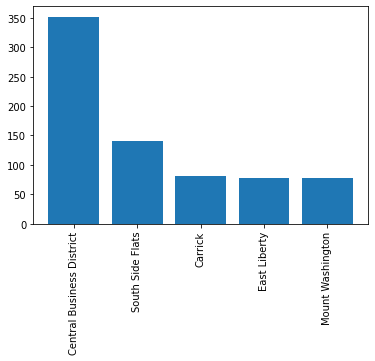

Central Business District: 352
South Side Flats: 140
Carrick: 81
East Liberty: 77
Mount Washington: 77


In [5]:
simpleIBA = dict()

# Get the top 5 areas and add them into the simpleIBA (Incident By Area) dictionary.
i = 0
for k, v in incidentsByArea:
    if i > 4:
        break
    simpleIBA[k] = v
    i += 1

# Plot
plt.bar(range(len(simpleIBA)), list(simpleIBA.values()), align='center')
plt.xticks(range(len(simpleIBA)), list(simpleIBA.keys()), rotation=90)

plt.show()

# Print the dictionary below the plot for easy readability.
for k in simpleIBA:
    print(k + ": " + str(simpleIBA[k]))

Here we can see the top 5 highest crime as past this the numbers are more insignificant that they aren't important to look at. Unfortunately, 99 is misc and is not classified, but this is the majority of the crime in these areas.

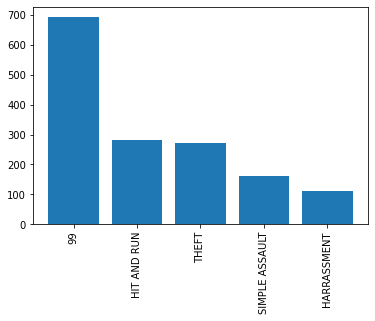

99: 692
HIT AND RUN: 282
THEFT: 271
SIMPLE ASSAULT: 161
HARRASSMENT: 110


In [6]:
simpleIBD = dict()

# Get the top 5 crime descriptions and add them into the simpleIBD (Incident By Description) dictionary.
i = 0
for k, v in incidentsByDesc:
    if i > 4:
        break
    simpleIBD[k] = v
    i += 1

# Plot
plt.bar(range(len(simpleIBD)), list(simpleIBD.values()), align='center')
plt.xticks(range(len(simpleIBD)), list(simpleIBD.keys()), rotation=90)

plt.show()

# Print the dictionary below the plot for easy readability.
for k in simpleIBD:
    print(k + ": " + str(simpleIBD[k]))

I was a bit disappointed in this data as a ton is labeled under misc. crime, and there was no real order of crime severity to check the highest severity of crime. Plus, misc. crime isn't descriptive as to what classifies as misc. crime. So I decided to read in the 2020 census neighborhood population to see how much crime is happening per person that lives there. I then read through the file and gathered the information for the total 2020 population in each area.

In [7]:
pop = pd.read_csv("2020 Neighborhood Population.csv", sep=",")

popPerNeighborhood = dict()

# Count how many crime incidents are in each area, and how many crime incidents for each description.
for index, row in pop.iterrows():
    n = row['Neighborhood']
    d = row['2020_Total_Population']
    if n not in popPerNeighborhood:
        popPerNeighborhood[n] = int(d)

# Sort data
popPerNeighborhood = sorted(popPerNeighborhood.items(), key = lambda x:x[1], reverse = True)

Now that I have the population, I decided to get a crime percentage by taking the number of incidents in an area divided by the total population for the area. Because the data considers certain neighborhoods of 11 people a valid neighborhood (even though it really isn't recognized), we are filtering out those by requiring a minimum population of 100.

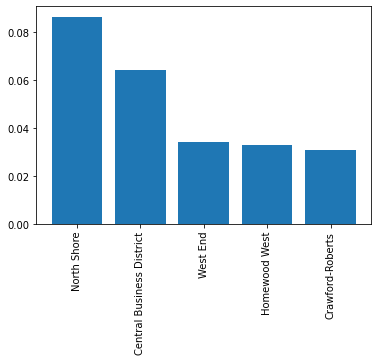

North Shore: 0.08637873754152824
Central Business District: 0.06426876027022092
West End: 0.03414634146341464
Homewood West: 0.03271028037383177
Crawford-Roberts: 0.030527692978630616


In [8]:
crimeRateNeighborhood = dict()

for kIBA, vIBA in incidentsByArea:
    for kPPN, vPPN in popPerNeighborhood:
        if str(kIBA) in str(kPPN) and vPPN > 100:
            crimeRateNeighborhood[kIBA] = vIBA / vPPN

crimeRateNeighborhood = sorted(crimeRateNeighborhood.items(), key = lambda x:x[1], reverse = True)

simpleCRN = dict()

# Get the top 5 
i = 0
for k, v in crimeRateNeighborhood:
    if i > 4:
        break
    simpleCRN[k] = v
    i += 1

# Plot
plt.bar(range(len(simpleCRN)), list(simpleCRN.values()), align='center')
plt.xticks(range(len(simpleCRN)), list(simpleCRN.keys()), rotation=90)

plt.show()

# Print the dictionary below the plot for easy readability.
for k in simpleCRN:
    print(k + ": " + str(simpleCRN[k]))

### Conclusion

Here we can see the highest crime rate is North Shore at over 8%. The second highest is Central Business District (Downtown) at over 6%. The rest of the data is between 3% and lower. Because of this, North Shore and Downtown are the outliers with a high amount of cime. Because of this, they should not be included as the highest areas with crime that is over the average of a Pittsburgh neighborhood.

#### <font color='dark pink'> The Most Greenery (Parks) - Caroline

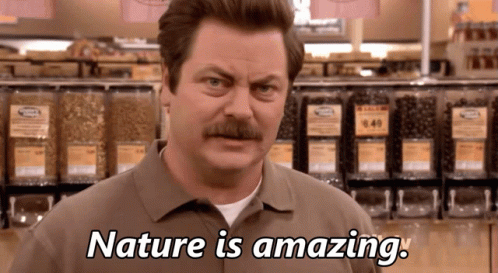

In [2]:
import pandas as pd
import geopandas
import matplotlib.pyplot as plt
%matplotlib inline

parks = pd.read_csv('PittParks.csv')
neighbors = pd.read_csv('PittNeighborhoods.csv')

##### <font color='pink'>1. I first imported 'pandas' in order to use it for some of the manipulations I do of the cvs files such as mathmatical operations and file iterations. I also imported the tools I will later use for visualization. </font>
##### <font color='pink'>2. I then read through both of the csv files I am using, one of which is a list of all registered Pittsburgh parks and their corresponding sectors, and the other a list of all Pittsburgh neighborhoods and their corresponding sectors.</font>

sector
10    4.703252e+07
8     2.866169e+07
12    1.812870e+07
Name: sqft, dtype: float64


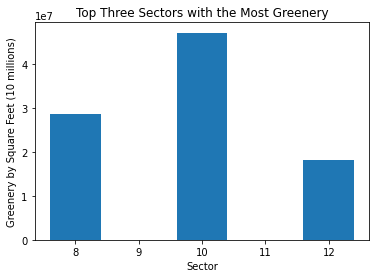

In [20]:
for index, row in parks.iterrows():
    park_sector_total = parks.groupby('sector')['sqft'].sum()
topThree = park_sector_total.nlargest(3)
print(topThree)
sector_lst = [12, 8, 10]
sqft_lst = [18128700, 28661690,47032520]
plt.bar(sector_lst, sqft_lst)
plt.title('Top Three Sectors with the Most Greenery')
plt.xlabel('Sector')
plt.ylabel('Greenery by Square Feet (10 millions)')
plt.show()

##### <font color='pink'> 3. Next, I iterated through each row of the Park csv and summed up the sizes (in square feet) of each of the parks by sector. I only printed out the maximum 3 values out of the total 16 for simplicity, as the neighborhoods with the maximum amount of greenery (measured by park size) are what we are looking for. I represent this as a bar graph for easy readability.</font>

In [3]:
hood_by_sector = neighbors.groupby(['sectors'])

##### <font color='pink'> 4. Here I move on to working with the second csv file which provides data on which sector each of the 90 Pittsburgh neighborhoods are located in. In order to work with this large file more easily, I grouped the data by sector.</font>

In [4]:
hood_by_sector[['sectors', 'hood']].get_group(10)

,sectors,hood
1,10,Squirrel Hill North
59,10,Point Breeze
80,10,Squirrel Hill South
82,10,Swisshelm Park
85,10,Regent Square


In [5]:
hood_by_sector[['sectors', 'hood']].get_group(8)

,sectors,hood
14,8,Lincoln Place
25,8,Hays
37,8,New Homestead


In [6]:
hood_by_sector[['sectors', 'hood']].get_group(12)

,sectors,hood
2,12,Garfield
11,12,East Liberty
13,12,Morningside
20,12,Larimer
36,12,Highland Park
41,12,Friendship
52,12,Bloomfield
75,12,Shadyside


##### <font color='pink'> 5. After grouping by sector, I print out the 3 sectors (and their corresponding neighborhoods) that I had previously found had the largest amount of greenery.</font>

In [9]:
park_by_sector = parks.groupby(['sector'])

##### <font color='pink'> 6. I then begin the long process of allocating which specific parks are in which specific neighborhoods by grouping the parks by sector in order to print out their exact names, as seen below this comment.</font>

In [10]:
park_by_sector[['sector', 'origpkname', 'sqft']].get_group(10)

,sector,origpkname,sqft
15,10,Windermere Circle 1 & 2,2.598780e+03
27,10,Glen Arden Triangle,3.138659e+02
60,10,Vietnam Island,1.025567e+04
64,10,Edgerton Circle,7.204733e+01
99,10,Mellon Park Island,2.926903e+04
110,10,Glen Arden Circle,4.658370e+01
118,10,Le Roi Rd Island,5.424572e+03
124,10,Saline St Passive Area,1.471427e+04
126,10,Reynolds St Planting Circle,1.651979e+03
145,10,Monitor St and St Phil Islands,3.443843e+03


In [11]:
park_by_sector[['sector', 'origpkname', 'sqft']].get_group(8)

,sector,origpkname,sqft
2,8,Revenue Park,2.041572e+04
24,8,McBride Park,9.900413e+05
37,8,Lincoln Place Parklet,2.767123e+04
112,8,Hays Parklet,5.502180e+04
179,8,Hays Woods,2.756854e+07


In [12]:
park_by_sector[['sector', 'origpkname', 'sqft']].get_group(12)

,sector,origpkname,sqft
3,12,Friendship Park,8.517818e+04
4,12,Heths Playground,2.225066e+05
13,12,Penn Circle W Triangle,3.206918e+03
21,12,Frankstown Triangle 1 & 2,1.978108e+05
32,12,Osceola Parklet,5.216117e+04
40,12,Fort Pitt Playground,4.128907e+05
54,12,Garland Parklet,1.232353e+05
58,12,Larimer Playground,6.591181e+04
62,12,Amber Triangle,4.497676e+03
73,12,Penn Circle W Square,1.298834e+03


##### <font color='pink'> 7. Due to the data above, I may now easily figure out how much square feet of park is in each neighborhood. Once again, I will only be doing this process with the top three sectors as this process pertains to the specific neighborhoods in each sector, and thus the neighborhoods in the top three are most likely to have the most greenery.</font>

##### <font color='pink'> Sector 10 <font>
    
| Squirrel Hill North | Point Breeze | Squirrel Hill South | Swisshelm Park | Regent Square |
| --- | --- | --- | --- | --- |
| Melon Park Island | Glen Arden Triangle | Vietnam Island | Windermere Circle | --- |
| Mellon Park | Edgerton Circle | Saline St Passive Area | Swisshelm Parklet | --- |
| Wightman Playground | Glen Arden Circle | Monitor St and St Phil Islands| Swisshelm War Memorial (205) | --- |
| --- | Le Roi Rd Island | Schenley Park | --- | --- |
| --- | Reynolds St Planting Circle | Davis Parklet | --- | --- |
| --- | --- | Frick Park | --- | --- |
| | | Total Square Feet Per Park | 
| 1542744.27 | 7509.04793 | 45427489.243 | 54768.267 | 0 |


##### <font color='pink'> Sector 8 <font>
| Lincoln Place | Hays | New Homestead |
| --- | --- | --- |
| McBride Park | Hays Parklet | Revenue Park |
| Lincoln Place Parklet | Hays Woods | --- |
|  | Total Square Feet Per Park | |
| 1017712.53 | 27623561.8 | 20415.72 |

##### <font color='pink'> Sector 12<font>
| Garfield | East Liberty | Morningside | Larimer | Highland Park | Friendship | Bloomfield | Shadyside |
| --- | --- | --- | --- | --- | --- | --- | --- |
| Fort Pitt Playground | Penn Circle W Triangle | --- | Frankstown Triangle 1 & 2 | Heths Playground | Friendship Park | Osceola Parklet | --- |
| Kite Hill Parklet | Penn Circle W Square | --- | Larimer Playground | Highland Ave Plant Strip | --- | Morrow Triangle | --- |
| Nelson Mandela Peace Park | Garland Parklet | --- | --- | Highland Park | --- | --- | --- |
| --- | Amber Triangle | --- | --- | --- | --- | --- | --- |
| --- | Negley Run Strip | --- | --- | --- | --- | --- | --- |
| --- | Enright Parklet | --- | --- | --- | --- | --- | --- |
| --- | Baum Negley Triangle | --- | --- | --- | --- | --- | --- |
| --- | Negley-Collins Triangle | --- | --- | --- | --- | --- | --- |
| --- |Negley Run Blvd | --- | --- | --- | --- | --- | --- |
| --- | East Liberty Strip | --- | --- | --- | --- | --- | --- |
| --- | Liberty Green Park | --- | --- | --- | --- | --- | --- |
|  |  |  | Total Square Feet Per Park |  |  |  |  |
| 466833.46 | 547946.624 | 0 | 263722.61 | 16686694.07 | 85178.18 | 78323.24 | 0 |

##### <font color='pink'> 8. The three tables above are a full breakdown of the three sectors with the most greenery (parks), each neighboorhood in each of these sectors, which parks are in which neighborhoods, and finally the total square feet per park per neighborhood. In order to make this process more simple and easy, I used the following two maps:<font>

<div>
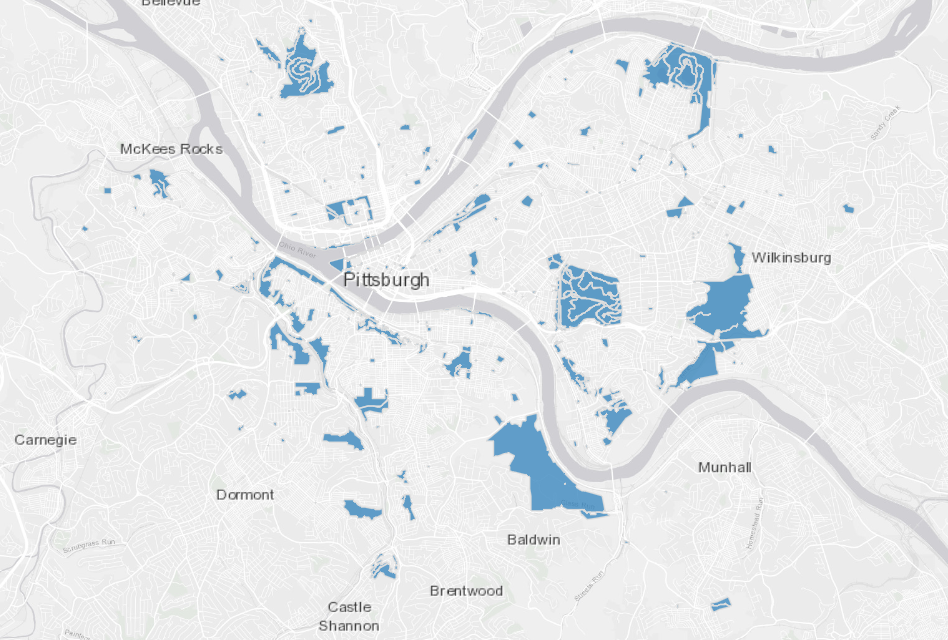
</div>
<div>
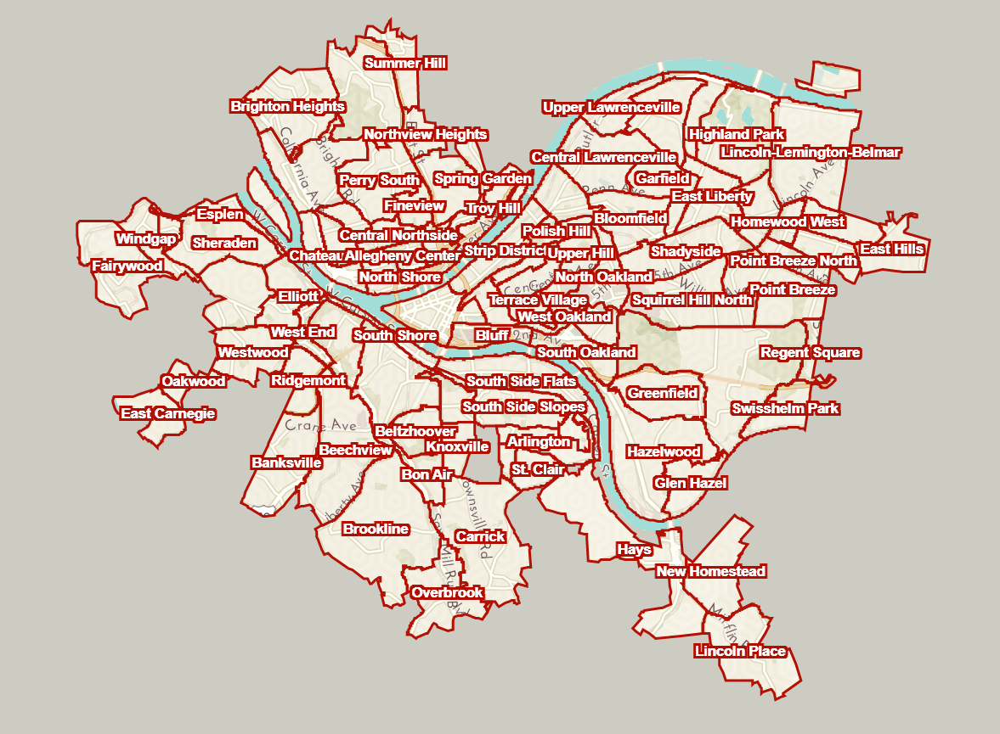
</div>

##### <font color='pink'> 9. According to all the above data, the top three neighborhoods with the most square feet of greenery(park) include: <font>
    
<font color='red'> - Squirrel Hill South (45,427,489.243 sqft)  <font>
     
<font color='red'> - Hays (27,623,561.8 sqft)  <font>
       
<font color='red'> - Highland Park (16,686,694.07 sqft)  <font>
    

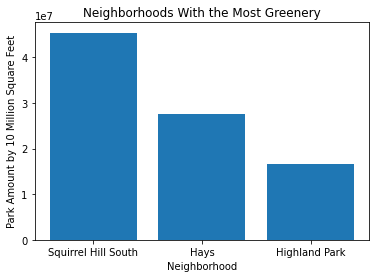

In [22]:
Neighborhood = ['Squirrel Hill South', 'Hays', 'Highland Park']
parkAmount= [45427489.243, 27623561.8, 16686694.07]

plt.bar(Neighborhood, parkAmount)
plt.title('Neighborhoods With the Most Greenery')
plt.xlabel('Neighborhood')
plt.ylabel('Park Amount by 10 Million Square Feet')
plt.show()

#### <font color='dark pink'> The Least Amount of Fires - Chandu

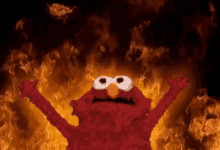

**First, I imported panda and the necessary visualization functions before I imported the data. I use these to analyze the amount of Fire Incidents per neighborhood in the City of Pittsburgh**

In [26]:
import pandas as pd
import geopandas
import matplotlib.pyplot as plt
%matplotlib inline

data = pd.read_csv("Fire Incidents.csv", sep=",")
data

,call_no,incident_type,type_description,address,alarm_time,alarms,primary_unit,census_tract,neighborhood,council_district,ward,tract,public_works_division,pli_division,police_zone,fire_zone,latitude,longitude
0,F160029985,111.0,Building fire,"800 BLOCK CENTER ST, WILKINSBURG PA 15221",2016-04-21 5:01:04,1,231EN16,NaN,NaN,NaN,NaN,4.200356e+10,NaN,NaN,NaN,3-16,40.441275,-79.882485
1,F180022058,111.0,Building fire,"1100 BLOCK JANE ST, WILKINSBURG PA 15221",2018-03-13 8:34:43,1,231EN16,NaN,NaN,NaN,NaN,4.200356e+10,NaN,NaN,NaN,3-21,40.436342,-79.881003
2,F180022102,131.0,Passenger vehicle fire,"SB STATE HWY 28 SB AT 31S, PITTSBURGH PA 15212",2018-03-13 11:54:23,0,231EN32,2406.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1-1A,NaN,NaN
3,F170043431,131.0,Passenger vehicle fire,"1700 BLOCK BELLEAU DR, PITTSBURGH PA 15212",2017-05-31 8:39:47,0,231EN38,2509.0,Fineview,6.0,25.0,4.200325e+10,1.0,25.0,1.0,1-10,40.460303,-80.006980
4,F180021111,111.0,Building fire,"2400 BLOCK VILLAGE RD, PITTSBURGH PA 15205",2018-03-09 10:26:42,1,231EN31,2808.0,Fairywood,2.0,28.0,4.200356e+10,5.0,28.0,6.0,1-16,40.449009,-80.076607
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9189,F230030699,162.0,Outside equipment fire,"4500 BLOCK LYTLE ST, PITTSBURGH PA 15207",2023-04-15 18:13:52,0,231EN13,1501.0,Hazelwood,5.0,15.0,4.200356e+10,3.0,15.0,4.0,2-13,40.413524,-79.948076
9190,F230030791,111.0,Building fire,"200 BLOCK JUCUNDA ST, PITTSBURGH PA 15210",2023-04-15 23:11:30,1,231EN22,3001.0,Knoxville,3.0,30.0,4.200330e+10,5.0,30.0,3.0,4-6,40.417191,-79.991052
9191,F230031660,111.0,Building fire,"00 BLOCK LAWN ST, PITTSBURGH PA 15213",2023-04-19 1:03:28,1,231EN10,409.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2-10,NaN,NaN
9192,F230031765,113.0,"Cooking fire, confined to container","1400 BLOCK CRUCIBLE ST, PITTSBURGH PA 15220",2023-04-19 10:52:47,1,231EN30,2814.0,Crafton Heights,2.0,28.0,4.200328e+10,5.0,28.0,6.0,1-17,40.448579,-80.049711


*As you can see from the data above there is quite a bit of information present in the csv file that is not useful to the specific data I am trying to analyze, so I filter this out.*

In [27]:
shortlist = data[['type_description', 'neighborhood']]
shortlist

,type_description,neighborhood
0,Building fire,NaN
1,Building fire,NaN
2,Passenger vehicle fire,NaN
3,Passenger vehicle fire,Fineview
4,Building fire,Fairywood
...,...,...
9189,Outside equipment fire,Hazelwood
9190,Building fire,Knoxville
9191,Building fire,NaN
9192,"Cooking fire, confined to container",Crafton Heights


*I filtered for the two most relevant columns: neighborhoods and types of fires*

Text(0.5, 1.0, 'Number of fires in each neighborhood')

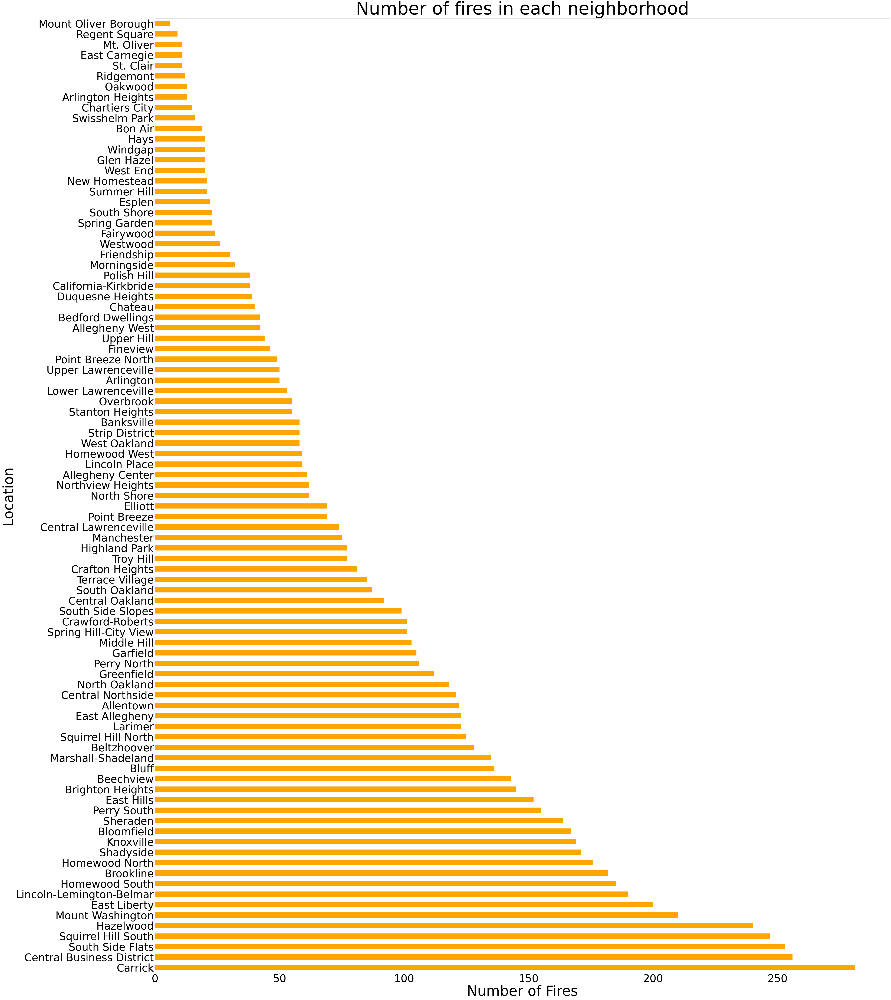

In [28]:
MAQ = shortlist['neighborhood'].value_counts()
MAQ.plot.barh(subplots=True, figsize=(75,100), fontsize=60, color='orange')
plt.xlabel('Number of Fires', fontsize=80)
plt.ylabel('Location', fontsize=80)
plt.title('Number of fires in each neighborhood', fontsize=100)
              

*Since types of fires and neighborhoods are both categorical values it would be hard to represent them with graphs,so I had to count the number of fires for each neighborhood using a pandas count value function*

*After I did that I then made the bar graph using the data derived from the the count values function*

### Conclusion
Based on the data shown in my graph, the top 5 neighborhoods with the most crime were Hazelwood, Squirrel Hill South, South Side Flats, Central Business District, and Carrik. This shows that when people are looking for neighborhoods to live in. These 5 will probably be the ones that most people will likely want to stay away from unless you are a fire fighter of course.

### <font color='pink'> The Best Neighborhood: 

<font color='dark pink'> In order to find out which neighborhood is the best, we must first take a look at our data. Which neighborhoods had the least crime? Which had the most greenery? Which had the least amount of fires?

<font color='dark pink'> While many neighborhoods had a lesser amount of crime, the ones with the most crime (that we will certainly not be choosing as the best neighborhood) are:
* <font color='dark pink'> North Shore
* <font color='dark pink'> Central Business District
* <font color='dark pink'> West End
* <font color='dark pink'> Homewood West
* <font color='dark pink'> Crawford-Roberts

<font color='dark pink'> The neighborhoods with the most greenery included:
* <font color='dark pink'> Squirrel Hill South
* <font color='dark pink'> Hays
* <font color='dark pink'> Highland Park

<font color=' dark pink'> And finally, in terms of neighborhoods with the least amount of fires, some of the neighborhoods in the top 15 are:
* <font color=' dark pink'> Mount Oliver Borough
* <font color=' dark pink'> Regent Square
* <font color=' dark pink'> Oakwood
* <font color=' dark pink'> Swisshelm Park
* <font color=' dark pink'> Hays

<font color='dark pink'> Overall, there is a clear winner here. The only neighborhood that does not have high crime rates, is one of the top three neighborhoods with the most greenery, and is in the top 15 neighborhoods with the least amount of fires is **Hays**. Now, you may be asking: "Hey, why are you using a neighborhood in the top 15 for least amount of fires instead of the top ten or top five?". Well, we did this because when looking at the graph in our code it is clear that many neighborhoods have a significantly less amount of fires than the rest, and vary only slightly from each other in number, and this gave us the ability to be able to consider more of them.

### <font color='pink'> Our Conclusions:

#### <font color='dark pink'> Brandon:
<font color='darkpink'> This data was a bit surprising to be as I was not expecting this neighborhood to be one of the top at first. I was expecting a more larger scale neighborhood like Squirrel Hill or Highland Park to be the winner, especially due to the greenery. It was surprising to me that Hays won the best for greenery and also least amount of fires. However, after doing some more research on Hayes, I can understand that the greenery was a large factor. I did not realize Squirrel Hill had so many fires at first until after this dataset.

#### <font color='darkpink'> Caroline:
<font color='darkpink'>  Overall I am not surprised that Hays came out to be the best neighborhood according to our data. This is because, as I was doing my initial research, some neighborhoods certainly looked to be better than others at first glance. Some looked better maintained, some looked more exciting, etc. In addition to this, I also expected Squirrel Hill South, Hays, and Highland Park to have the most greenery because those three neighborhoods are home to some of Pittsburghs largest parks and wooded areas. However, one thing that was interesting to me is that Squirrel Hill South was not considered the best over Hays. This was mostly because Squirrel Hill, for whatever reason, as a huge amount of fires. This is unfortunate to me because Squirrel Hill is actually my personal favorite neighborhood. 

#### <font color='dark pink'>Chandu:
<font color='darkpink'> As you can see from my graph, Hays placed in the lower 15 percent of all the data for the number of fires in pittsburgh neighborhoods. With all the overall data this neighborhood also placed very well and hopefully if you want to live there the houses or interest rates aren’t too high. Personally, I was also hoping that Squirrel Hill was the best neighborhood. The Thai places there are so good.

### <font color='pink'> Thank You For Your Time!

<font color='darkpink'> We hope that everyone enjoyed the presentation, and if there are any questions, please ask and we would be happy to answer!

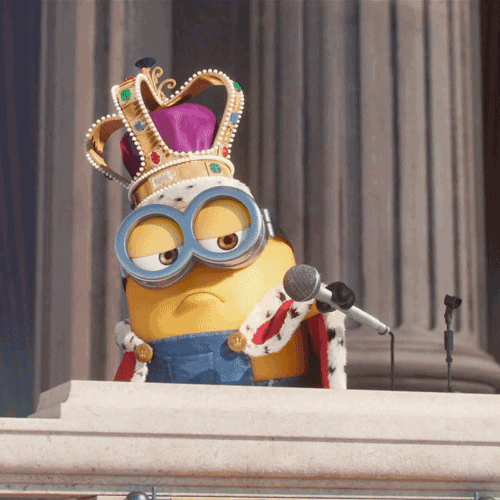